# Objekterkennung von Plastik in Flüssen
Projekt in Programming Languages For Data Science
Annika Scheug, Sommersemester 2023

## Use Case Beschreibung
Unsere Ozeane sind zunehmend von Plastikmüll verschmutzt. Vieles davon gelangt vom Inland über Flüsse ins Meer. Daher muss der Plastikmüll aus den Flüssen gefischt werden, bevor er ins Meer gelangt. Diese Arbeit kann mithilfe von Objekterkennung erleichtert werden.  
Daher soll ein Modell zur Erkennung von Plastikmüll in Flüssen zu trainiert werden. Dafür wird ein Datensatz mit über 3000 Trainingsdaten verwendet (https://kili-technology.com/data-labeling/machine-learning/kili-s-community-challenge-plastic-in-river-dataset).
Ziel ist es, dass das Modell verschiedene Arten von Plastikmüll (Plastikflasche, -tüte oder andere) zuverlässig erkennt und somit der Müll gezielt entfernt werden kann.  
Echte Bildaufnahmen könnten später durch das Anbringen von Kameras an geeigneten Stellen gewonnen werden. Diese können an das Modell übergeben werden und dieses identifiziert wo auf dem Bild sich welche Art von Plastikmüll befindet.  
Relevante Variablen zu einem Bild sind somit das Label des Plastikmüllobjekts sowie dessen Location auf dem Bild. Diese Angabe wird mithilfe sogenannter Bounding Boxes vorgenommen.  

Das Projekt beinhaltet die prototypische Implementierung des Object Detection Modells und dessen Deployment in einer Shinyapp. Die Modellierung erfolgt in diesem Jupyter Notebook, während die Shinyapp in RStudio entwickelt wird.  

Für die Modellierung wird Huggingface Transformers genutzt. Der Datensatz ist dort bereits als Huggingface Dataset vorhanden und kann direkt geladen werden. Zudem wird ein vortrainiertes Modell für Object Detection geladen und über die Trainer API für den spezifischen Anwendungsfall optimiert.  
Für die Evaluierung wird zunächst der Loss betrachtet. Als weitere Metrik werden Mean Average Precision und Mean Average Recall unter Verwendung der Intersection over Union (IoU) berechnet. Diese gibt an, inwieweit sich die tatsächliche Bounding Box mit der durch das Modell vorhergesagten Bouding Box überschneiden. Die IoU kann Werte zwischen 0 und 1 einnehmen, wobei ein höherer Wert besser ist. Für die Bestimmung von Precision und Recall wird ein Threshold für IoU bestimmt, ab welchem eine Vorhersage als Positive gewertet wird. Somit können True Positive, False Positive etc. bestimmt werden.  
Im Anschluss an die Metriken werden für eine abschließende Evaluation einige Beispiele mit ihren vorhergesagten und tatsächlichen Bounding Boxes geplottet und miteinander verglichen.

## Datenimport und -exploration
Zunächst werden notwendige Bibliotheken installiert und importiert und anschließend die Daten von Huggingface geladen.

In [1]:
# install packages
!pip install datasets
!pip install transformers
!pip install timm
!pip install evaluate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 474.6/474.6 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 23.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 47.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 30.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 16.3 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 53.2 MB/s eta 0:00

In [2]:
# load libraries
from datasets import load_dataset, load_from_disk
import torch
import torchvision
from torchvision.ops import box_convert, box_area
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms.functional import pil_to_tensor, to_pil_image
from transformers import AutoImageProcessor, AutoModelForObjectDetection, TrainingArguments, Trainer

import albumentations
import numpy as np
import copy
import os
import evaluate
from tqdm import tqdm
from PIL import Image, ImageDraw


In [ ]:
# load dataset from huggingface
raw_data = load_dataset("Kili/plastic_in_river")


Generating train split:   0%|          | 0/3407 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/427 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/425 [00:00<?, ? examples/s]

Dataset plastic_in_river downloaded and prepared to /root/.cache/huggingface/datasets/Kili___plastic_in_river/default/1.3.0/9f50c1fffe85018c95137b17f0e5a271be58507e17e7a3f3a4075f763c20b8de. Subsequent calls will reuse this data.


  0%|          | 0/3 [00:00<?, ?it/s]

In [ ]:
raw_data

DatasetDict({
    train: Dataset({
        features: ['image', 'litter'],
        num_rows: 3407
    })
    test: Dataset({
        features: ['image', 'litter'],
        num_rows: 427
    })
    validation: Dataset({
        features: ['image', 'litter'],
        num_rows: 425
    })
})

Das Datenset ist bereits in Trainings-, Validierungs- und Testdaten gesplittet.  
Es enthält 3407 Trainingsdaten, 425 Validierungsdaten und 427 Testdaten. Diese enthalten jeweils ein Bild und Label.

In [ ]:
raw_data['train'][0]

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1280x720 at 0x7F6CA0A50DC0>,
 'litter': {'label': [2, 2],
  'bbox': [[0.6937950849533081,
    0.17073695361614227,
    0.017922647297382355,
    0.011738809756934643],
   [0.5574886202812195,
    0.18079878389835358,
    0.021695835515856743,
    0.010061836801469326]]}}

Ein einzelnes Datenelement enthält ein Bild mit Größenangabe, sowie ein Dictionary mit Labeldaten. Dazu gehören die Label der Objekte auf dem Bilder als Array, sowie deren Bounding Boxes als weiterer Array je Box.  
Die Bounding Boxes sind normalisiert (zu erkennen an den Werten zwischen 0 und 1) und müssen daher für einen Plot mit der Imagesize multipliziert werden.  
Ein Datensatz enthält aktuell keine eindeutige image_id. Außerdem fehlt die Angabe der Box Area, welche später für die Modellierung benötigt wird.
Ein einzelnes Bild kann über über den Zusatz ['image'] angezeigt werden.  
Das oben gezeigte Beispiel mit Größe 1280x740 enthält zwei Label, was bedeutet, dass zwei Plastikobjekte auf dem Bild gelabelt wurden. Dieses wird nachfolgend angezeigt.

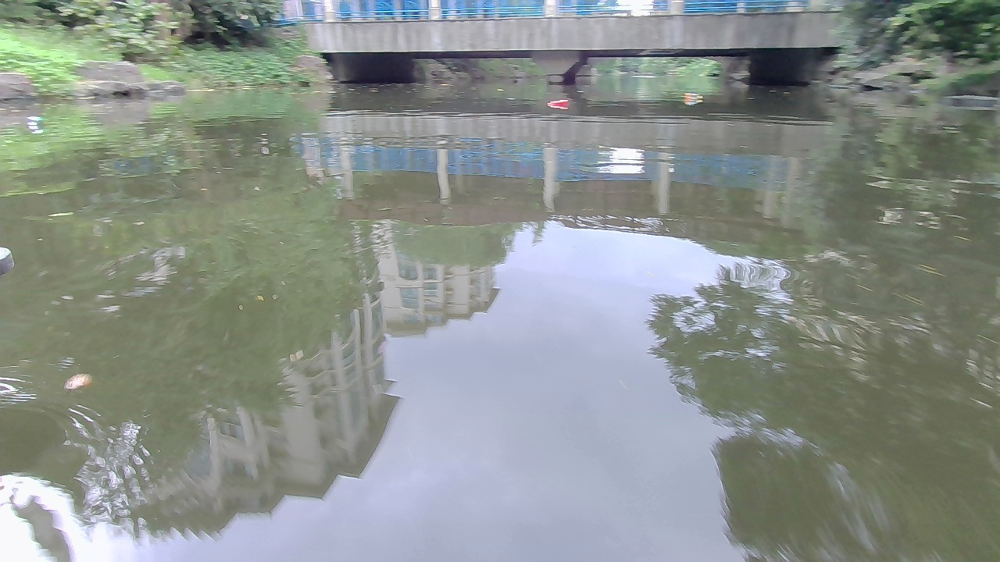

In [ ]:
raw_data['train'][0]['image']

In der oberen Bildmitte sind die zwei Objekte zu erkennen.  
  
Die Untersuchung eines weiteren Beispiels zeigt, dass nicht alle Bilder die gleiche Größe haben. Das untere Beispiel hat eine Größe von 1280x640 Pixeln.

In [ ]:
raw_data['train'][231]

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1280x640 at 0x7F6CA3915660>,
 'litter': {'label': [1, 1, 1],
  'bbox': [[0.5589997172355652,
    0.9052388072013855,
    0.10933980345726013,
    0.1676543653011322],
   [0.9318922162055969,
    0.8428240418434143,
    0.13621555268764496,
    0.11025097221136093],
   [0.2740328907966614,
    0.45102307200431824,
    0.023234708234667778,
    0.01731213554739952]]}}

Als nächstes wird der Rohdatensatz umgewandelt. Dafür werden weitere Spalten image_id und area hinzugefügt. Die Box Area kann dabei aus den Werten der Bounding Boxes bestimmt werden. Diese müssen zuvor mit der Bildgröße multipliziert und auf das richtige Format xyxy transformiert werden. In den Rohdaten liegen die Bouding Boxes im Format cxcywh vor, also Angabe der normalisierten Pixelwerte von der Center X und Y Koordinate, sowie Breiten (width w) nd Höhenangabe (height h) der Bounding Box. 



In [ ]:
image_id = 0
id = 0

def to_right_format(im):
  global image_id
  global id
  id_list = []

  w = im['image'].size[0]
  h = im['image'].size[1]
  #box = resize_bbox(im['litter'][0]['bbox'], w, h)

  bbox = im['litter']['bbox'].copy()
  for x in range(len(bbox)):
      bbox[x][0] = bbox[x][0] * w
      bbox[x][1] = bbox[x][1] * h
      bbox[x][2] = bbox[x][2] * w
      bbox[x][3] = bbox[x][3] * h
      id_list.append(id)
      id = id + 1
  try:
    area = box_area(box_convert(torch.tensor(bbox), 'cxcywh', 'xyxy')).tolist()
  except:
    area = []
      
  dic = {
      'image_id': image_id,
      'image': im['image'],
      'width': w,
      'height': h,
      'objects': {
        'id': id_list,
        'area': area,
        'bbox': bbox,
        'category': im['litter']['label']
      }
  }
  image_id = image_id + 1
  return dic


Mithilfe der map() Methode von huggingface datasets werden die neu erzeugten Spalten jedem Datenelement angehängt.

In [ ]:
ds = raw_data.map(to_right_format)

Map:   0%|          | 0/3407 [00:00<?, ? examples/s]

Map:   0%|          | 0/427 [00:00<?, ? examples/s]

Map:   0%|          | 0/425 [00:00<?, ? examples/s]

In [ ]:
ds['train'][0]

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1280x720 at 0x7F6CA3880730>,
 'litter': {'label': [2, 2],
  'bbox': [[888.0577392578125,
    122.93060302734375,
    22.940988540649414,
    8.451943397521973],
   [713.58544921875,
    130.1751251220703,
    27.77066993713379,
    7.244522571563721]]},
 'image_id': 0,
 'width': 1280,
 'height': 720,
 'objects': {'area': [193.8965301513672, 201.18515014648438],
  'bbox': [[888.0577087402344,
    122.93060660362244,
    22.940988540649414,
    8.451943024992943],
   [713.5854339599609,
    130.17512440681458,
    27.77066946029663,
    7.244522497057915]],
  'category': [2, 2],
  'id': [0, 1]}}

Das Datenset hat nun die benötigte Struktur. Es wird daher gespeichert, sodass bei einer Wiederausführung des Skripts die Daten nicht immer wieder neu aus Huggingface geladen werden müssen. Stattdessen kann direkt das bearbeitet Datenset aus dem lokalen Speicher geladen werden.

In [ ]:
ds.save_to_disk("/content/drive/MyDrive/Master/plastic-data/dataset")

In [3]:
ds = load_from_disk("/content/drive/MyDrive/Master/plastic-data/dataset")

In [ ]:
ds['train'][0]

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1280x720 at 0x7F6D8EDB6E60>,
 'litter': {'label': [2, 2],
  'bbox': [[888.0577392578125,
    122.93060302734375,
    22.940988540649414,
    8.451943397521973],
   [713.58544921875,
    130.1751251220703,
    27.77066993713379,
    7.244522571563721]]},
 'image_id': 0,
 'width': 1280,
 'height': 720,
 'objects': {'area': [193.8965301513672, 201.18515014648438],
  'bbox': [[888.0577087402344,
    122.93060660362244,
    22.940988540649414,
    8.451943024992943],
   [713.5854339599609,
    130.17512440681458,
    27.77066946029663,
    7.244522497057915]],
  'category': [2, 2],
  'id': [0, 1]}}

Als nächstes wird untersucht, welche verschiedenen Ausprägungen von Plastikmüll im Datenset vorliegen.

In [4]:
# all possible object categories
categories = ds['train'].features['litter'].feature['label']
categories

ClassLabel(names=['PLASTIC_BAG', 'PLASTIC_BOTTLE', 'OTHER_PLASTIC_WASTE', 'NOT_PLASTIC_WASTE'], id=None)

Es existieren vier Arten von Objekten im Datensatz: Plastiktüte, Plastikflasche, anderer Plastikmüll und kein Plastikmüll.  
Für die Modellierung werden nachfolgend Mappings von ID zu Label und umgekehrt erstellt.

In [5]:
# mapping id2label and label2id
cat = ds['train'].features['litter'].feature['label'].names
id2label = {index: x for index, x in enumerate(cat, start=0)}
label2id = {v: k for k, v in id2label.items()}

Als nächstes sollen die Label der Daten genauer untersucht werden. Dafür werden einige Beispielbilder zuerst ohne und dann mit Bounding Boxes und Labeln geplotted.  
Hierfür wird die Funktion draw_bb erstellt.

In [6]:
def draw_bb(example):
  return to_pil_image(
        draw_bounding_boxes(
            pil_to_tensor(example['image']),
            box_convert(torch.tensor(example['objects']['bbox']), 'cxcywh', 'xyxy'),
            colors='red',
            labels=[categories.int2str(x) for x in example['objects']['category']]
        )
  )

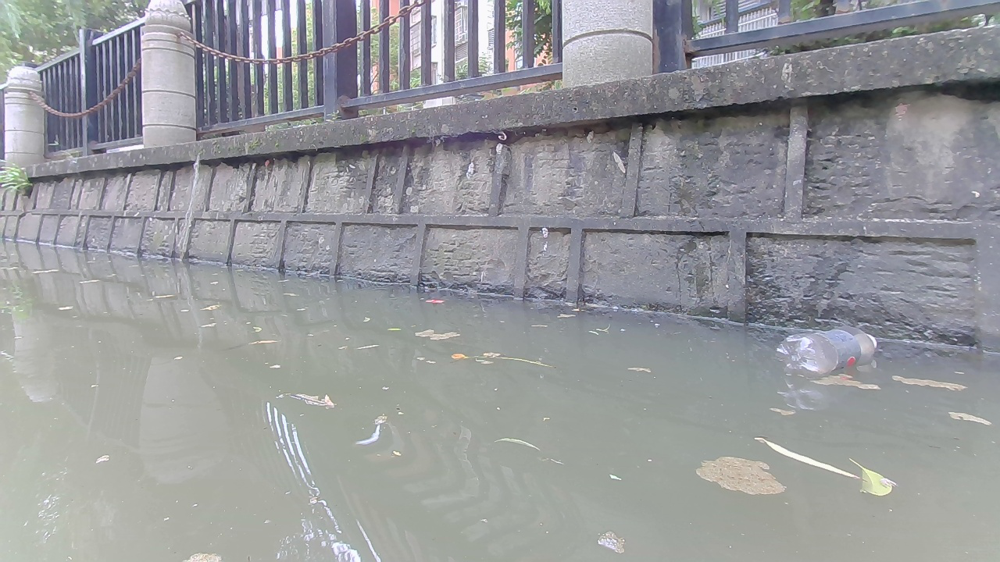

In [ ]:
# show image without bbox
ds['train'][4]['image']

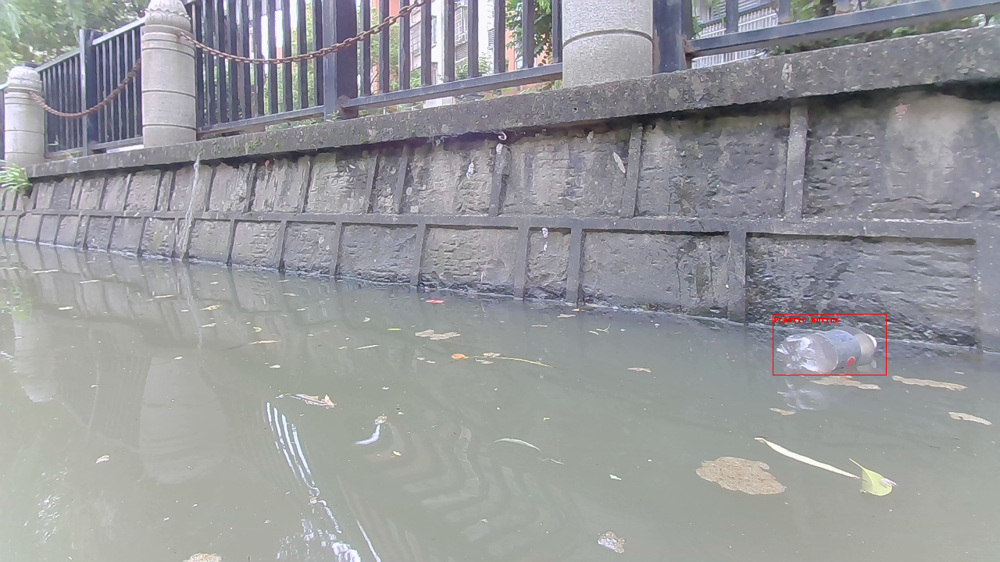

In [ ]:
draw_bb(ds['train'][4])

Die Plastikflasche im Bild ist korrekt gelabelt.

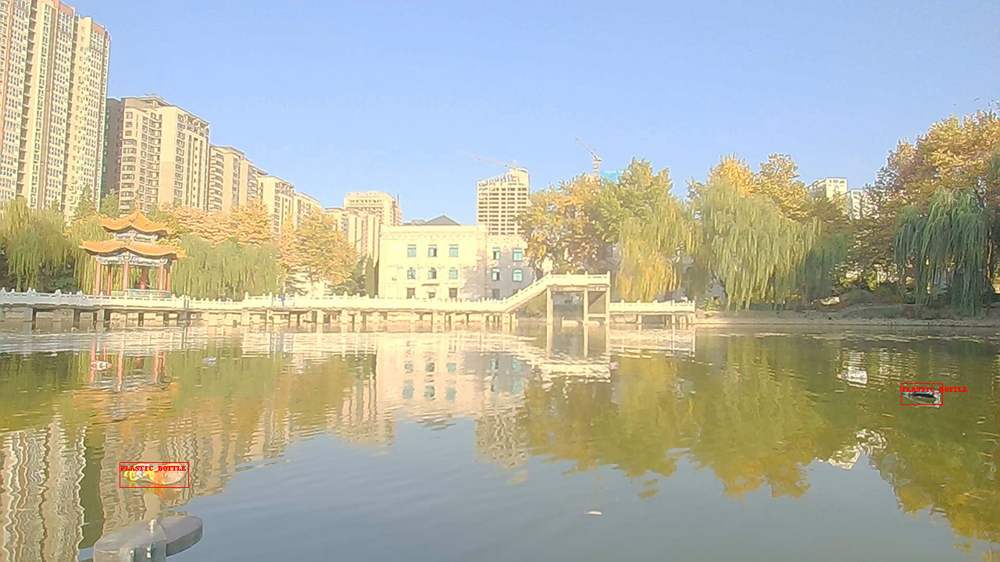

In [ ]:
draw_bb(ds['train'][2])

Im Bild sind einige Plastikflaschen im Fluss zu erkennen. Allerdings sind nur zwei von ihnen gelabelt, wie unten nochmal am Datensatz zu erkennen. Eine gewisse Unschärfe der Trainingsdaten ist daher vorhanden. Dies könnte sich negativ auf das Modelltraining auswirken. 

In [ ]:
ds['train'][2]

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1280x720 at 0x7F6D8EA248B0>,
 'litter': {'label': [1, 1],
  'bbox': [[1179.984375,
    505.21630859375,
    53.03300857543945,
    26.516504287719727],
   [197.54794311523438,
    608.6306762695312,
    87.50446319580078,
    31.819805145263672]]},
 'image_id': 2,
 'width': 1280,
 'height': 720,
 'objects': {'area': [1406.247314453125, 2784.37646484375],
  'bbox': [[1179.9844360351562,
    505.2162981033325,
    53.03300857543945,
    26.516503393650055],
   [197.5479507446289,
    608.630690574646,
    87.50446319580078,
    31.81980460882187]],
  'category': [1, 1],
  'id': [6, 7]}}

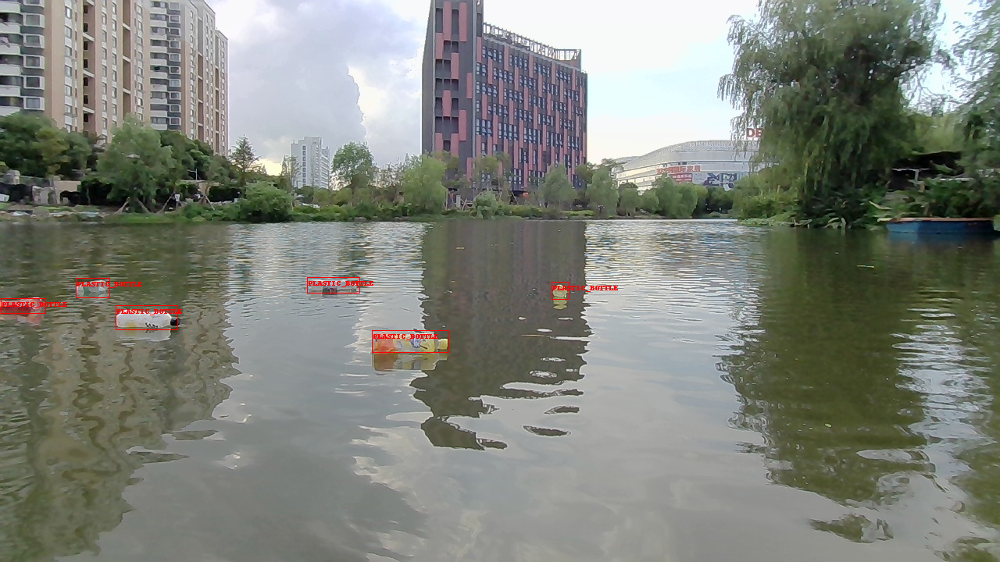

In [ ]:
draw_bb(ds['train'][233])

Dieses Beispiel ist sehr gut gelabelt.  
Insgesamt ist bereits an den wenigen Beispielen auffällig, dass es wesentlich mehr Plastikflaschen als anderen Plastikmüll auf den Bildern im Datensatz zu geben scheint. Es ist daher zu erwarten, dass das Modell hauptsächlich Plastikflaschen entdecken wird aufgrund von Biased Data.

## Preprocessing
Im nächsten Schritt werden die Daten für die Modellierung vorbereitet.  
Huggingface Models können bereits mit einem eigenen image_processor heruntergeladen werden. Allerdings benötigt auch dieser ein spezielles Inputformat, sodass die Daten vorher noch weiter bearbeitet werden müssen.  
Als Model wurde das facebook/detr-resnet-50 Object Detection zum Finetuning ausgewählt (https://huggingface.co/facebook/detr-resnet-50), da sich dieses großer Beliebtheit bedient und gut performt. Es wurde bereits über 300 epochs auf 16 V100 GPUs trainiert und kann zwischen 100 Objektklassen unterscheiden.  
Daher wird nun der image_processor dieses Modells geladen.

In [7]:
checkpoint = "facebook/detr-resnet-50"
image_processor = AutoImageProcessor.from_pretrained(checkpoint)

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.
The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


Mithilfe von Image Augmentation kann die Datenmenge des Trainingssets künstlich vergrößert werden und Overfitting des Models verhindert werden.. Jedes Bild wird bei seinem Aufruf um einen Zufallsfaktor gespiegelt oder gedreht, sodass es für das Modell wie ein neuer Datensatz wirkt. Dafür wird die Bibliothek "Albumentations" verwendet. Diese sorgt dafür, dass bei einem zufälligen Drehen oder Spiegeln der Bilder die Bounding Boxes entsprechend mitverändert werden, sodass Bild und Label weiterhin zusammenpassen.  
Außerdem kann in diesem Schritt die Bildgröße angepasst werden. Die Bilder werden nun alle auf eine einheitliche Größe von 720x720 angepasst. Diese Größe wurde gewählt, da die Bilder aufgrund kleiner Objekte nicht zu klein sein dürfen. Bei den meisten Bildern ist die schmalste Seite 720 Pixel groß. Daher wurde diese Größe für alle Bilder ausgewählt.  
Die Test- und Validierungsdaten sollen nicht augmentiert werden. Daher wird eine eigene Methode für diese Daten geschrieben, welche nur die Bildgröße anpasst.

In [8]:
img_size = 720
augmentation = albumentations.Compose(
    [
    albumentations.Resize(img_size, img_size),
    albumentations.RandomRotate90(),
    albumentations.HorizontalFlip(p=0.5),
    albumentations.RandomBrightnessContrast(p=1.0),
    ], bbox_params=albumentations.BboxParams(format='coco',  label_fields=['category'])
)



transform_test = albumentations.Compose(
    [
        albumentations.Resize(img_size, img_size),

    ],
    bbox_params=albumentations.BboxParams(format='coco', label_fields=['category']),
)

Mithilfe der folgenden Methode wird die Image Augmentation auf einen ausgewählten Datenumfang angewendet, sodass das Ergebnis überprüft werden kann.

In [9]:
def aug(examples):
    images, bboxes, categories = [], [], []
    for image, objects in zip(examples['image'], examples['objects']):
        image = np.array(image.convert("RGB"))[:, :, ::-1]
        try:
          box = box_convert(torch.tensor(objects['bbox']), 'cxcywh', 'xywh').tolist()
        except:
          box = []
        out = augmentation(
            image=image,
            bboxes=box,
            category=objects['category']
        )
        images.append(torch.tensor(out['image']).flip(-1).permute(2, 0, 1))
        bboxes.append(out["bboxes"])
        categories.append(out['category'])
    return {'image': images, 'bbox': bboxes, 'category': categories}

Testweise werden 10 Datensätze der Trainingsdaten augmentiert.

In [ ]:
ds_aug = ds['train'].select(range(10))
ds_aug = ds_aug.with_transform(aug)

In [ ]:
def draw_bb2(example):
  return to_pil_image(
        draw_bounding_boxes(
            example['image'],
            box_convert(torch.tensor(example['bbox']), 'xywh', 'xyxy'),
            colors='red',
            labels=[categories.int2str(x) for x in example['category']]
        )
  )

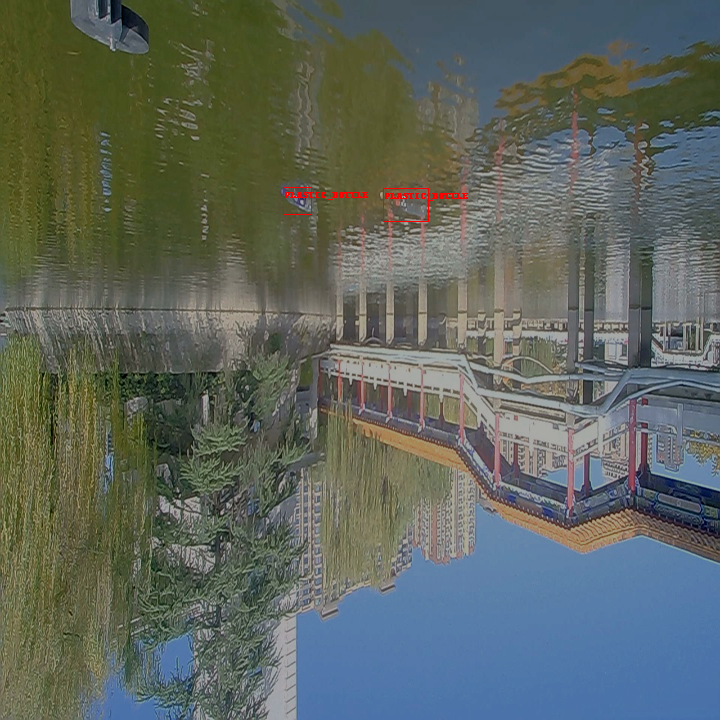

In [ ]:
draw_bb2(ds_aug[9])

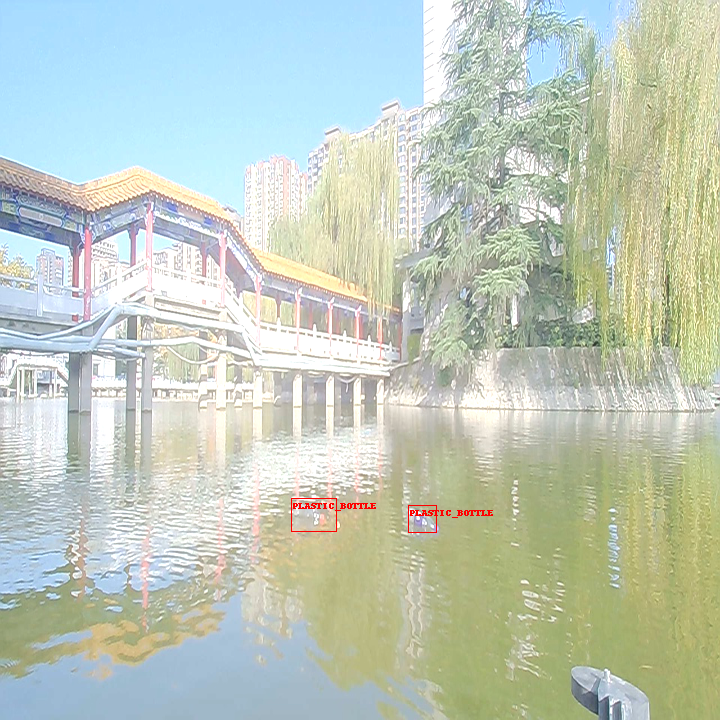

In [ ]:
draw_bb2(ds_aug[9])

Bei jedem Aufruf wird das Bild neu um einen zufälligen Faktor gedreht oder gespiegelt. Die Bounding Boxes verschieben sich entsprechend mit. Außerdem wurde die Bildgröße wie gewünscht angepasst.

Nun wird eine Methode definiert, welche die Daten in das erwartete Format für den image_processor vorbereitet.

In [10]:
def formatted_anns(image_id, category, area, bbox):
    annotations = []
    for i in range(0, len(category)):
        new_ann = {
            'image_id': image_id,
            'category_id': category[i],
            'isCrowd': 0,
            'area': area[i],
            'bbox': list(bbox[i]),
        }
        annotations.append(new_ann)

    return annotations

Für das Preprocessing der Daten wird nun die zuvor gezeigte Image Augmentation ausgeführt und deren Output mithilfe der eben definierten Methode in das richtige Formate für den image_processor umgewandelt und anschließend an diesen übergeben.  
Für Validierungsdaten wird die transform Methode ohne Augmentation aufgerufen.

In [29]:
# transforming a batch
def transform_aug_ann(examples):
    image_ids = examples['image_id']
    images, bboxes, area, categories = [], [], [], []
    for image, objects in zip(examples['image'], examples['objects']):
        image = np.array(image.convert('RGB'))[:, :, ::-1]
        try:
          box = box_convert(torch.tensor(objects['bbox']), 'cxcywh', 'xywh').tolist()
        except:
          box = []

        out = augmentation(
            image=image, 
            bboxes=box, 
            category=objects['category'])

        area.append(objects['area'])
        images.append(out['image'])
        bboxes.append(out['bboxes'])
        categories.append(out['category'])

    targets = [
        {'image_id': id_, 'annotations': formatted_anns(id_, cat_, ar_, box_)}
        for id_, cat_, ar_, box_ in zip(image_ids, categories, area, bboxes)
    ]

    return image_processor(images=images, annotations=targets, return_tensors="pt")

def transform_aug_ann_val(examples):
    image_ids = examples['image_id']
    images, bboxes, area, categories = [], [], [], []
    for image, objects in zip(examples['image'], examples['objects']):
        image = np.array(image.convert("RGB"))[:, :, ::-1]
        try:
          box = box_convert(torch.tensor(objects['bbox']), 'cxcywh', 'xywh').tolist()
        except:
          box = []
        out = transform_test(image=image, bboxes=box, category=objects['category'])

        area.append(objects['area'])
        images.append(out['image'])
        bboxes.append(out['bboxes'])
        categories.append(out['category'])

    targets = [
        {'image_id': id_, 'annotations': formatted_anns(id_, cat_, ar_, box_)}
        for id_, cat_, ar_, box_ in zip(image_ids, categories, area, bboxes)
    ]

    return image_processor(images=images, annotations=targets, return_tensors="pt")

Nachfolgend wird das Preprocessing auf die Daten angewendet und diese als Train bzw. Validation Data gespeichert.

In [30]:
train = ds['train'].with_transform(transform_aug_ann)
val = ds['validation'].with_transform(transform_aug_ann_val)


In [31]:
train[0]

{'pixel_values': tensor([[[-0.8507, -0.7650, -0.7479,  ..., -0.7308, -0.5938, -0.5424],
          [-0.8335, -0.8164, -0.7308,  ..., -0.6452, -0.5596, -0.5424],
          [-0.7993, -0.7479, -0.6623,  ..., -0.5938, -0.7308, -0.6794],
          ...,
          [-0.5253, -0.5596, -0.5938,  ...,  2.2489,  2.2489,  2.2489],
          [-0.5082, -0.5424, -0.5938,  ...,  2.2489,  2.2489,  2.2489],
          [-0.4911, -0.5424, -0.6109,  ...,  2.2489,  2.2489,  2.2489]],
 
         [[-0.3200, -0.1975, -0.1099,  ..., -0.3200, -0.2500, -0.1975],
          [-0.2850, -0.2325, -0.0749,  ..., -0.2675, -0.2150, -0.1975],
          [-0.2325, -0.1800, -0.0224,  ..., -0.2150, -0.3725, -0.3025],
          ...,
          [ 0.1001,  0.0826,  0.0651,  ...,  2.4286,  2.4286,  2.4286],
          [ 0.1352,  0.0826,  0.0651,  ...,  2.4286,  2.4286,  2.4286],
          [ 0.1527,  0.1001,  0.0301,  ...,  2.4286,  2.4286,  2.4286]],
 
         [[-0.5844, -0.4973, -0.4973,  ..., -0.2707, -0.2010, -0.1835],
          [-

Die Daten wurden nun in ein Dictionary aus Tensor Objekten transformiert. Dazu gehören pixel_values, pixel_mask, sowie die labels (zusammengesetzt aus image_id, class_labels, boxes, area,..) Dieses Format wird vom Modell genau so erwartet.  
Das Preprocessing der Daten für die Modellierung ist nun fast abgeschlossen. Es fehlt noch eine Methode, welche mehrere Bilder zu einem Batch zusammenfassen kann. Dafür dient die nachfolgende Methode, welche im Training je nach Batchsize aufgerufen wird.

In [14]:
def collate_fn(batch):
    pixel_values = [item['pixel_values'] for item in batch]
    encoding = image_processor.pad_and_create_pixel_mask(pixel_values, return_tensors="pt")
    labels = [item['labels'] for item in batch]
    batch = {}
    batch['pixel_values'] = encoding['pixel_values']
    batch['pixel_mask'] = encoding['pixel_mask']
    batch['labels'] = labels
    return batch

Es wurde festgestellt, dass die Trainings- und Validierungsdaten korrupte Daten enthalten. Bei diesen ragt die Bounding Box aus dem Bild heraus, weshalb das Modell im Training nicht damit umgehen kann und abbricht. Aus diesem Grund werden die korrupten Daten aus dem Datenset entfernt.  
Mithilfe der auskommentierten Schleifen wurden die korrputen Daten identifiziert. Um Rechenpower zu sparen, wurden die Schleifen nur einmal ausgeführt und die Indizes in der nächsten Codezelle für den nächsten Durchlauf hartkodiert.

In [ ]:
# check for corrupt data train
# remove_idx= []
# for i in range(len(train)):
#   try:
#     train[i]
#   except:
#     print("corrupt: " + str(i))
#     remove_idx.append(i)
#     continue

# keep = [i for i in range(len(train)) if i not in remove_idx]
# train = train.select(keep)

# check for corrupt data val
# remove_idx_val= []
# for i in range(len(val)):
#   try:
#     val[i]
#   except:
#     print("corrupt: " + str(i))
#     remove_idx_val.append(i)
#     continue

# keep_val = [i for i in range(len(val)) if i not in remove_idx_val]
# val = val.select(keep_val)

In [15]:
# remove corrupt data from train dataset
# idx found out with below loop in comments for train and val dataset
remove_idx = [1012, 1560, 1734, 1845, 2447, 3057, 3060, 3359]
keep = [i for i in range(len(train)) if i not in remove_idx]
train = train.select(keep)

# remove corrput data from validation set
remove_idx_val= [149, 155, 353]
keep_val = [i for i in range(len(val)) if i not in remove_idx_val]
val = val.select(keep_val)

## Modellierung
Nach der Datenexploration und -transformation folgt nun die Modellierung.  
Hierfür wird, wie bereits erwähnt, ein vortrainiertes Modell von Huggingface geladen. Dieses Modell ist auf 100 Objektklassen optimiert, weshalb der Classifier komplett neu trainiert werden muss. Auch die Inputgröße der Daten unterscheidet sich vom ursprünglichen Modell und muss neu initialisiert werden. Alle anderen Gewichte werden übernommen und im Finetuning angepasst.  
Bei der Initialisierung des Modells werden die anfangs definierten Mappings von Label zu ID und umgekehrt, sowie die Anzahl der Objekte (num_labels) mitgegeben.

In [ ]:
model = AutoModelForObjectDetection.from_pretrained(
    checkpoint,
    id2label=id2label,
    label2id=label2id,
    num_labels=len(cat),
    ignore_mismatched_sizes=True,
)

Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-rsb-weights/resnet50_a1_0-14fe96d1.pth" to /root/.cache/torch/hub/checkpoints/resnet50_a1_0-14fe96d1.pth
Some weights of DetrForObjectDetection were not initialized from the model checkpoint at facebook/detr-resnet-50 and are newly initialized because the shapes did not match:
- class_labels_classifier.weight: found shape torch.Size([92, 256]) in the checkpoint and torch.Size([5, 256]) in the model instantiated
- class_labels_classifier.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([5]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In den Training Arguments werden Hyperparameter (wie bspw. Learning Rate  und Weight Decay) definiert. Außerdem wird die Batchgröße festgelegt sowie die Anzahl zu trainierender Epochen. Alle 250 Steps soll zudem eine Evaluierung mit den Validierungsdaten durchgeführt werden. Nach Abschluss des Trainings soll das beste Modell geladen werden.  
An dieser Stelle wurden bereits verschiedene Hyperparameter getestet. Dabei kam heraus, dass mind. 10 Epochen notwendig sind, um einigermaßen valide Ergebnisse zu erzielen. Daher wurden in diesem Beispiel 20 Epochen trainiert, um das bestmögliche Ergebnis zu erzielen. An der grundlegenden Modellarchitektur wurde nichts verändert.

In [ ]:
training_args = TrainingArguments(
    output_dir="detr50_finetuned_plastic-in-rivers",
    per_device_train_batch_size=20,
    num_train_epochs=20,
    seed=42,
    save_strategy="steps",
    logging_steps=250,
    learning_rate=1e-5,
    weight_decay=1e-4,
    save_total_limit=2,
    remove_unused_columns=False,
    evaluation_strategy="steps",
    load_best_model_at_end=True,
    metric_for_best_model="loss"
)

Als letzter Vorbereitungsschritt wird ein Trainer Objekt der Huggingface Trainer API initialisiert. Dieses benötigt die Angabe des zu optimierenden Models, die Training Arguments mit den Hyperparametern, die Batch-Funktion collate_fn, sowie die Angabe der Trainings- und Validierungsdaten und des Preprocessors.

In [ ]:
trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    train_dataset=train,
    tokenizer=image_processor,
    eval_dataset=val,
)


Anschließend wird das Training gestartet.

In [ ]:
trainer.train()

Step,Training Loss,Validation Loss
250,2.389200,1.826443
500,2.051800,1.622266
750,1.924600,1.564426
1000,1.865500,1.525842
1250,1.786000,1.452769
1500,1.745500,1.444716
1750,1.707200,1.412031
2000,1.714800,1.398921
2250,1.668300,1.356292
2500,1.662600,1.356816


TrainOutput(global_step=3400, training_loss=1.7951904880299288, metrics={'train_runtime': 8923.5496, 'train_samples_per_second': 7.618, 'train_steps_per_second': 0.381, 'total_flos': 3.248773127677439e+19, 'train_loss': 1.7951904880299288, 'epoch': 20.0})

Sowohl Trainings als auch Validation Loss haben sich zu Beginn stark reduziert und ca. ab Step 2250 im selben Wertespektrum eingependelt. Auffällig ist, dass der Trainings Loss stets höher als der Validation Loss ist. Dies könnte an Dropout Layern sowie Image Augmentation in der Traininsphase liegen.  
Allerdings erscheint der Loss prinzipiell noch etwas hoch.

Aufgrund langer Trainingszeit wird das Modell direkt im Anschluss an das Training gespeichert, um einen Verlust zu vermeiden. Mit den nachfolgenden Methoden können bereits trainierte und abgespeicherte Modelle geladen werden.

In [ ]:
model.save_pretrained("/content/drive/MyDrive/Master/finetuned-model-v6-imgsize720-20epochs")

In [16]:
model = AutoModelForObjectDetection.from_pretrained("/content/drive/MyDrive/Master/finetuned-model-v6-imgsize720-20epochs")

Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-rsb-weights/resnet50_a1_0-14fe96d1.pth" to /root/.cache/torch/hub/checkpoints/resnet50_a1_0-14fe96d1.pth


In [ ]:
model2 = AutoModelForObjectDetection.from_pretrained("/content/drive/MyDrive/Master/finetuned-model-v4")

In [ ]:
model3 = AutoModelForObjectDetection.from_pretrained("/content/drive/MyDrive/Master/finetuned-model-v5-imgsize480")

## Evaluation
Im letzten Schritt wird das Modell anhand der in der Einleitung beschriebenen Metriken evaluiert.  
Zur Bestimmung von Mean Average Precision und Mean Average Recall wird mithilfe von torchvision bestimmt. Hierfür muss das Testdatensatz zunächst in ein bestimmtes Format umgewandelt werden. 

In [ ]:
import json


# format annotations the same as for training, no need for data augmentation
def val_formatted_anns(image_id, objects):
    annotations = []
    for i in range(0, len(objects["id"])):
        new_ann = {
            'id': objects['id'][i],
            'category_id': objects['category'][i],
            'iscrowd': 0,
            'image_id': image_id,
            'area': objects['area'][i],
            'bbox': objects['bbox'][i],
        }
        annotations.append(new_ann)

    return annotations


# Save images and annotations into the files torchvision.datasets.CocoDetection expects
def save_annotation_file_images(plastic):
    output_json = {}
    path_output = f"{os.getcwd()}/plastic/"

    if not os.path.exists(path_output):
        os.makedirs(path_output)

    path_anno = os.path.join(path_output, "plastic_ann.json")
    categories_json = [{"supercategory": "none", "id": id, "name": id2label[id]} for id in id2label]
    output_json["images"] = []
    output_json["annotations"] = []
    for example in plastic:
        ann = val_formatted_anns(example["image_id"], example["objects"])
        output_json["images"].append(
            {
                "id": example["image_id"],
                "width": example["image"].width,
                "height": example["image"].height,
                "file_name": f"{example['image_id']}.png",
            }
        )
        output_json["annotations"].extend(ann)
    output_json["categories"] = categories_json

    with open(path_anno, "w") as file:
        json.dump(output_json, file, ensure_ascii=False, indent=4)

    for im, img_id in zip(plastic["image"], plastic["image_id"]):
        path_img = os.path.join(path_output, f"{img_id}.png")
        im.save(path_img)

    return path_output, path_anno

Dann wird eine Instanz von CocoDetection erstellt, welche in der cocoevaluation verwendet wird.

In [ ]:
class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, feature_extractor, ann_file):
        super().__init__(img_folder, ann_file)
        self.feature_extractor = feature_extractor

    def __getitem__(self, idx):
        # read in PIL image and target in COCO format
        img, target = super(CocoDetection, self).__getitem__(idx)

        # preprocess image and target: converting target to DETR format,
        # resizing + normalization of both image and target)
        image_id = self.ids[idx]
        target = {'image_id': image_id, 'annotations': target}
        encoding = self.feature_extractor(images=img, annotations=target, return_tensors="pt")
        pixel_values = encoding['pixel_values'].squeeze()  # remove batch dimension
        target = encoding['labels'][0]  # remove batch dimension

        return {'pixel_values': pixel_values, 'labels': target}


path_output, path_anno = save_annotation_file_images(ds['test'])
test_ds_coco_format = CocoDetection(path_output, image_processor, path_anno)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


Anschließend werden die Metriken berechnet.

In [ ]:
module = evaluate.load("ybelkada/cocoevaluate", coco=test_ds_coco_format.coco)
val_dataloader = torch.utils.data.DataLoader(
    test_ds_coco_format, batch_size=8, shuffle=False, num_workers=4, collate_fn=collate_fn
)

with torch.no_grad():
    for idx, batch in enumerate(tqdm(val_dataloader)):
        pixel_values = batch['pixel_values']
        pixel_mask = batch['pixel_mask']

        labels = [
            {k: v for k, v in t.items()} for t in batch['labels']
        ]  # these are in DETR format, resized + normalized

        # forward pass
        outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)

        orig_target_sizes = torch.stack([target['orig_size'] for target in labels], dim=0)
        results = image_processor.post_process(outputs, orig_target_sizes)  # convert outputs of model to COCO api

        module.add(prediction=results, reference=labels)
        del batch

results = module.compute()
print(results)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
  0%|          | 0/54 [00:00<?, ?it/s]This method is deprecated and will be removed in v4.27.0. Please use pad instead.
This method is deprecated and will be removed in v4.27.0. Please use pad instead.
This method is deprecated and will be removed in v4.27.0. Please use pad instead.
This method is deprecated and will be removed in v4.27.0. Please use pad instead.
`post_process` is deprecated and will be removed in v5 of Transformers, please use `post_process_object_detection`
100%|██████████| 54/54 [58:29<00:00, 64.99s/

Accumulating evaluation results...
DONE (t=0.79s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.002
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.001
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.002
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Leider erreichen Mean Average Precision und Mean Average Recall selten einen Wert über null. Dies deutet auf ein sehr schlechte Modell hin. Auch andere getestete Modelle konnten keine besseren Werte erzielen.  

Im Folgenden werden beispielhaft einige Vorhersagen des Modells genauer betrachtet. Dafür werden zunächst Vorhersagen für Testbilder gemacht und diese anschließend geplottet und mit den Originallabeln verglichen.

In [17]:
test_im1 = ds['test'][1]['image']
with torch.no_grad():
      inputs = image_processor(images=test_im1, return_tensors="pt")
      outputs = model(**inputs)
      target_sizes = torch.tensor([test_im1.size[::-1]])
      results = image_processor.post_process_object_detection(outputs, threshold=0.5, target_sizes=target_sizes)[0]

for score, label, box in zip(results['scores'], results['labels'], results['boxes']):
      box = [round(i, 2) for i in box.tolist()]
      print(
          f'Detected {model.config.id2label[label.item()]} with confidence '
          f'{round(score.item(), 3)} at location {box}'
      )

Detected PLASTIC_BOTTLE with confidence 0.597 at location [594.26, 447.68, 633.78, 466.66]
Detected PLASTIC_BOTTLE with confidence 0.624 at location [377.43, 275.13, 400.99, 294.07]
Detected PLASTIC_BOTTLE with confidence 0.53 at location [376.85, 274.1, 399.45, 290.87]
Detected PLASTIC_BOTTLE with confidence 0.62 at location [376.81, 275.69, 399.47, 294.13]


Das Modell hat im Beispielbild vier Plastikflaschen erkannt. An drei vorhergesagten Bounding Boxes ist auffällig, dass diese nah beiandner liegen zu scheinen.  
Nachfolgenden wird das Bild mit seinem tatsächlichen Label geplottet.

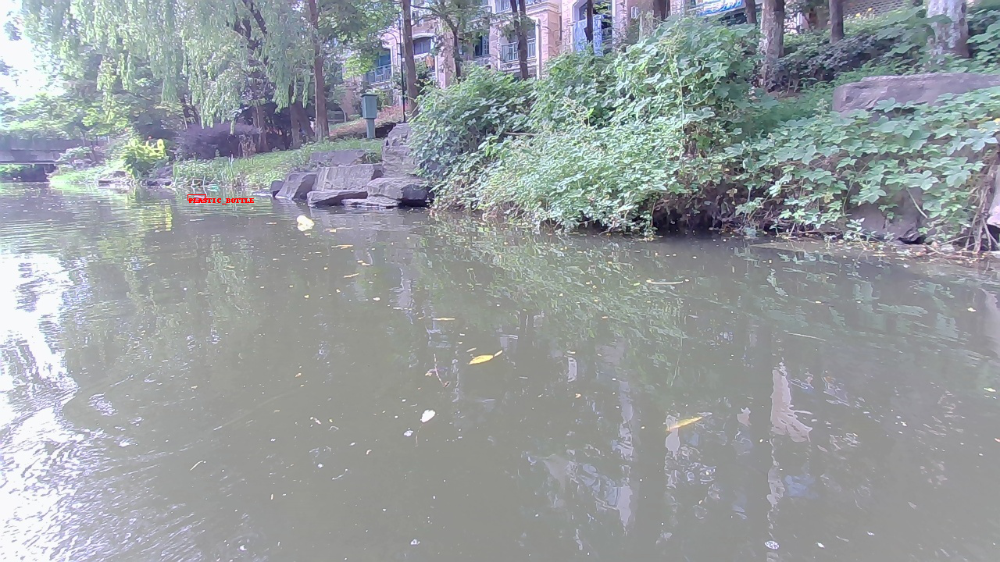

In [18]:
draw_bb(ds['test'][1])

In den Originaldaten hat das Bild ein Label (Plastikflasche). Tatsächlich scheint hierbei eine weitere kleine Flasche knapp hinter der gelabelten übersehen worden zu sein. Rechts vor der gelabelten Flasche schwimmt zudem etwas unerkenntliches im Wasser. Hierbei könnte es sich auch um Plastikmüll handeln, der nicht gelabelt wurde. Nachfolgend wird das Bild mit seinen vorhergesagten Labels geplottet.

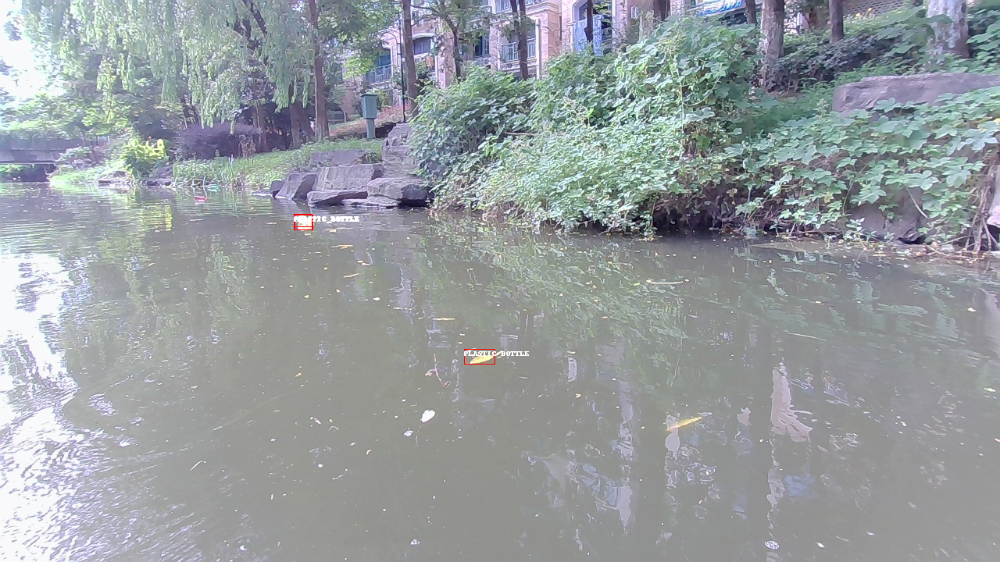

In [19]:
draw = ImageDraw.Draw(test_im1)

for score, label, box in zip(results['scores'], results['labels'], results['boxes']):
  box = [round(i, 2) for i in box.tolist()]
  x, y, x2, y2 = tuple(box)
  draw.rectangle((x, y, x2, y2), outline='red', width=1)
  draw.text((x, y), model.config.id2label[label.item()], fill='white')
test_im1

Das Modell hat das nicht identifizierbare Objekt im Vordergrund als Flasche erkannt. Die drei ähnlichen Bounding Boxes der Modellvorhersage liegen fast übereinander und sind im Plot kaum zu unterscheiden. Es hat das Objekt daher mehrmals als Flasche erkannt. Zudem wurde ein Blatt im Vordergrund fälschlicherweise als Flasche gelabelt.   
Leider wurde die im Datensatz gelabelte rote Flasche nicht erkannt. Allerdings sind die Objekte auf dem Foto auch nur sein klein, selbst für einen Menschen nicht ganz eindeutig zu sehen und daher auch für ein Modell schwer zu erkennen.  

Es wird ein weiteres Beispiel genauer untersucht.

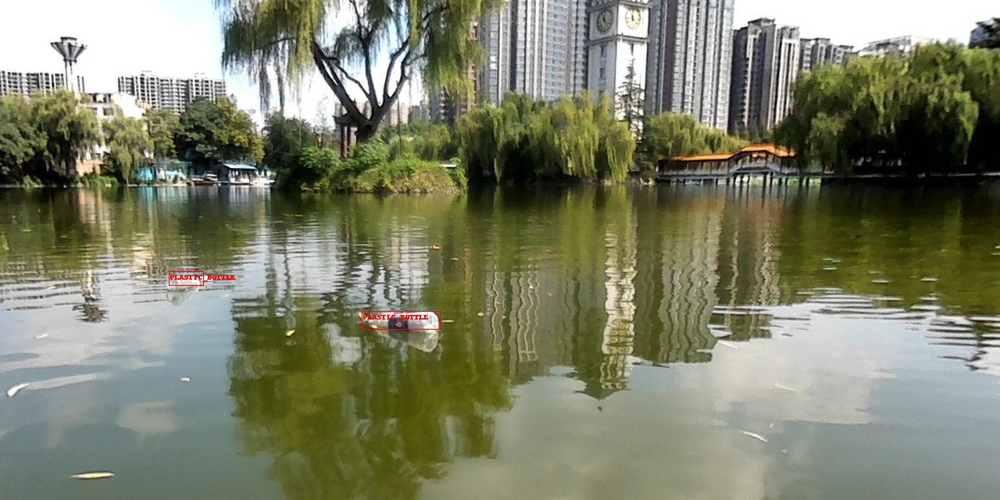

In [ ]:
draw_bb(ds['test'][31])

In [ ]:
test_im2 = ds['test'][31]['image']
with torch.no_grad():
      inputs = image_processor(images=test_im2, return_tensors="pt")
      outputs = model(**inputs)
      target_sizes = torch.tensor([test_im2.size[::-1]])
      results2 = image_processor.post_process_object_detection(outputs, threshold=0.5, target_sizes=target_sizes)[0]

for score, label, box in zip(results2['scores'], results2['labels'], results2['boxes']):
      box = [round(i, 2) for i in box.tolist()]
      print(
          f'Detected {model.config.id2label[label.item()]} with confidence '
          f'{round(score.item(), 3)} at location {box}'
      )

Detected PLASTIC_BOTTLE with confidence 0.584 at location [453.76, 391.18, 560.25, 420.62]
Detected PLASTIC_BOTTLE with confidence 0.772 at location [453.24, 390.78, 561.67, 427.75]
Detected PLASTIC_BOTTLE with confidence 0.581 at location [207.55, 347.53, 253.04, 366.81]
Detected PLASTIC_BOTTLE with confidence 0.574 at location [454.76, 391.44, 558.71, 419.25]


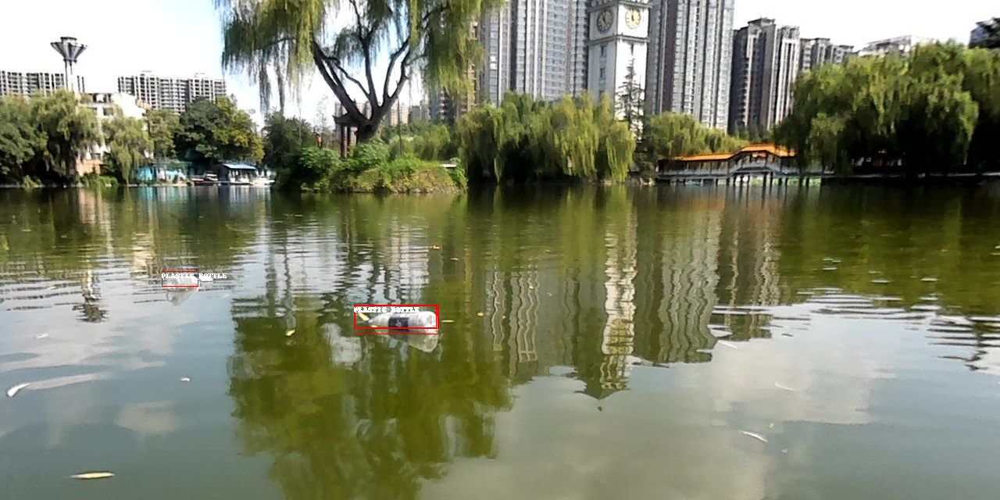

In [ ]:
draw = ImageDraw.Draw(test_im2)

for score, label, box in zip(results2['scores'], results2['labels'], results2['boxes']):
  box = [round(i, 2) for i in box.tolist()]
  x, y, x2, y2 = tuple(box)
  draw.rectangle((x, y, x2, y2), outline='red', width=1)
  draw.text((x, y), model.config.id2label[label.item()], fill='white')
test_im2

In diesem Beispiel hat das Modell die vordere Flasche gut erkannt. Jedoch wurde sie wieder mehrmals (dreimal) gelabelt. Die zweite Flasche im Hintergrund wurde richtig erkannt.

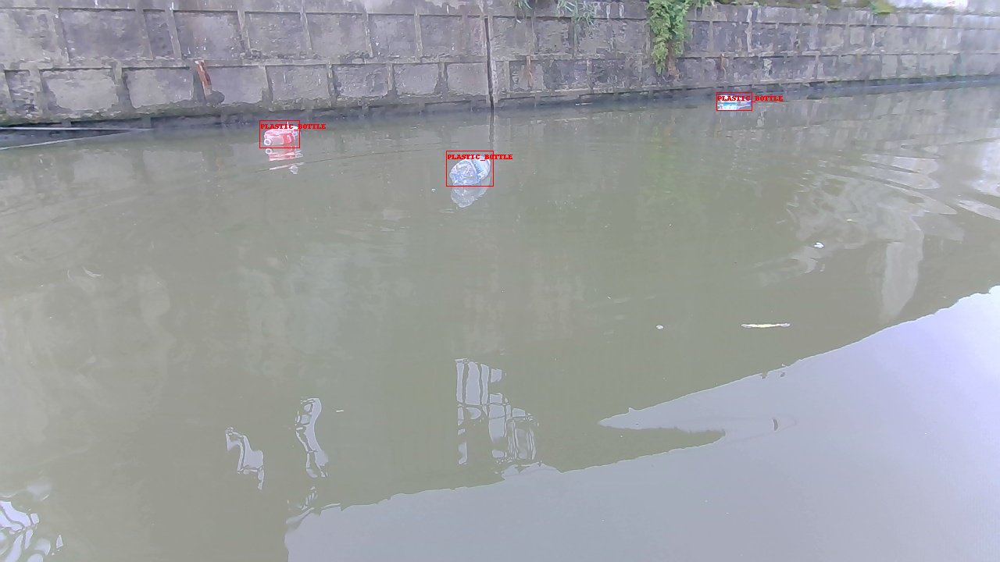

In [ ]:
draw_bb(ds['test'][55])

In [ ]:
test_im3 = ds['test'][55]['image']
with torch.no_grad():
      inputs = image_processor(images=test_im3, return_tensors='pt')
      outputs = model(**inputs)
      target_sizes = torch.tensor([test_im3.size[::-1]])
      results3 = image_processor.post_process_object_detection(outputs, threshold=0.5, target_sizes=target_sizes)[0]

for score, label, box in zip(results3['scores'], results3['labels'], results3['boxes']):
      box = [round(i, 2) for i in box.tolist()]
      print(
          f'Detected {model.config.id2label[label.item()]} with confidence '
          f'{round(score.item(), 3)} at location {box}'
      )

Detected PLASTIC_BOTTLE with confidence 0.611 at location [335.62, 158.74, 384.17, 188.62]
Detected PLASTIC_BOTTLE with confidence 0.718 at location [572.87, 195.37, 625.95, 243.01]
Detected PLASTIC_BOTTLE with confidence 0.539 at location [916.23, 119.3, 956.87, 138.35]


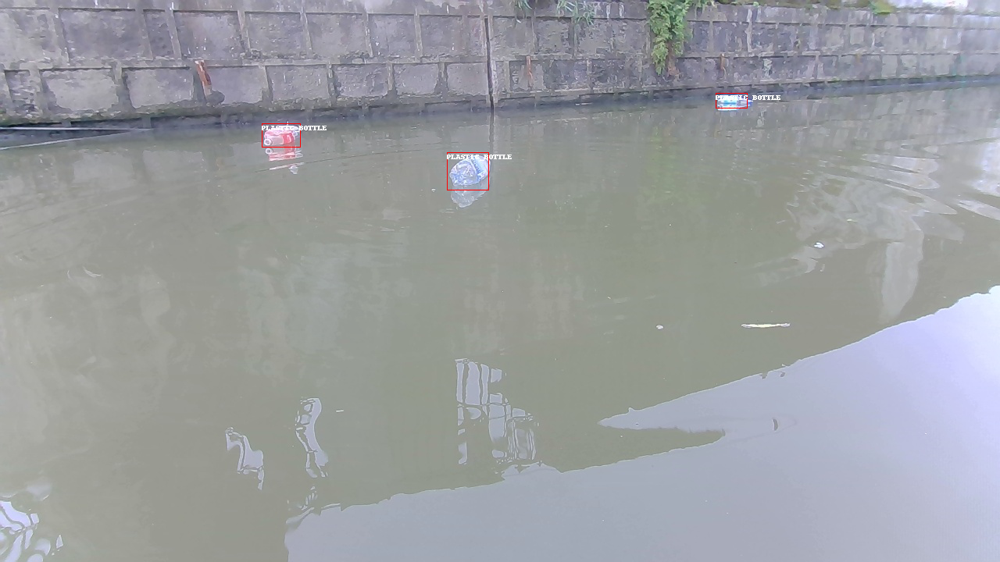

In [ ]:
draw = ImageDraw.Draw(test_im3)

for score, label, box in zip(results3['scores'], results3['labels'], results3['boxes]'):
  box = [round(i, 2) for i in box.tolist()]
  x, y, x2, y2 = tuple(box)
  draw.rectangle((x, y, x2, y2), outline='red', width=1)
  draw.text((x, y), model.config.id2label[label.item()], fill='white')
test_im3

In diesem Beispiel wurden alle Flaschen korrekt vom Modell erkannt.

## Finale Bewertung und Ausblick


Die Modellmetriken (Mean Average Precision und Recall) des Modells sind leider sehr schlecht. Allerdings fällt bei genauerer Untersuchung der Modellvorhersagen und ihrem manuellen Vergleich mit den tatsächlichen Lables auf, dass es doch nicht so schlecht ist, wie es auf den ersten Blick scheint.  
Das Modell erkennt den Plastikmüll, welcher nicht zu klein dargestellt ist. Es ist sich häufig jedoch nicht genau über die genaue Location der Bounding Boxes sicher und predicted daher öfter mehrere Bounding Boxes pro Objekt. Dies könnte auch mit der Spiegelung der Objekte in der Wasseroberfläche zusammenhängen, wie vor allem an test_im2 auffällig. Zudem wurde festgestellt, dass die Labels in den Trainingsdaten (ground_truth labels) auch nicht immer hundertprozent korrekt sind. Dies wirkt sich natürlich auch negativ auf das Modelltraining und somit dessen Vorhersagen aus.  
Ziel des Use Cases ist es, Plastikmüll in Flüssen zu erkennen, sodass dieser entfernt werden kann, bevor er ins Meer gelangt. Für den Use Case ist es daher nicht so schlimm, wenn Objekte mehrmals gelabelt werden. Dadurch wird der Müll trotzdem erkannt und kann beseitigt werden. Schlimmer ist es, wenn Objekte gar nicht erkannt werden, da sie so unentdeckt ins Meer schwimmen können.  

Für einen produktiven Einsatz des Modells reicht die Performance dennoch nicht aus. Um diese weiter zu verbessern, wäre es sinnvoll, die Label des Trainingsdatensets nochmal genau zu überprüfen und ggfs. zu korrigieren. Außerdem wurden in diesem Notebook nur Bilder  mit Label "Plastikflasche" erkannt. Eine Überprüfung der Objektkategorien in den Trainingsdaten erscheint daher ebenfalls sinnvoll. Gggfs. können nicht benötigte Kategorien entfernt werden.  
Darüber hinaus können im Modell Training weitere Hyperparameter ausprobiert und evaluiert werden. Ebenfalls interessant wäre es, ein anderes vortrainiertes Modell (bspw. hustvl/yolos-tiny) für den Anwendungsfall zu optimieren und dessen Performance mit dem facebook/detr-resnet-50 zu vergleichen.  

Trotz allem wird im Rahmen dieser Projektarbeit das hierin optimierte Modell in einer R Shinyapp deployed. Dies erfolgt außerhalb dieses Jupyter Notebooks in der Programmiersprache R.